## Creating networks from spatial data 1: Delaunay

### Networks in MuSpAn

In this tutorial, we will introduce how to construct networks using MuSpAn objects and how to quickly visualise them. 

The network infrastructure in MuSpAn is designed to be highly flexible to accommodate a wide variety of spatial analysis using spatial networks. In particular, MuSpAn translates the spatial data contained within the domain into a network that is constructed using [NetworkX](https://networkx.org). This means we can leverage the extensive set of network tools produced by networkX in the context of spatial biology and multiscale spatial analysis. 

MuSpAn allows the construction of three types of networks: Delaunay, K-Nearest Neighbour (KNN) and Proximity. Each network type has specific uses and varied interpretations dependent on the context of the data on which they are being constructed. For example, Delaunay networks generate a triangulated mesh of the data, which can be used to describe both local and global questions about the structure of our data. Alternatively, KNN networks are typically used to only understand local interactions between data.

In general, a MuSpAn describes pair-wise interactions between objects stored within a domain. These pair-wise interactions are represented using edges, and in the context of spatial data, the pair-wise relationship is typically dependent on the distance/space between any two objects, also known as **Spatial Networks** (for more information, see [Spatial Networks](https://arxiv.org/abs/1010.0302)). Critically, all nodes in a network are indexed using object IDs, which can be useful for integrating your networks with other analysis and querying. See the following tutorials. 

### Setting up a domain



To start, we will specifically focus on Delaunay networks to introduce the MuSpAn network functionality. We will demonstrate this on the Healthy Mouse Colon Xenium dataset used previously in the 'What is a query?' tutorial, so let's start with our usual imports and load this dataset.

In [1]:
# Import necessary libraries
import muspan as ms
import matplotlib.pyplot as plt

# Set the resolution for plots
plt.rcParams['figure.dpi'] = 270

# Load the example domain dataset
domain = ms.datasets.load_example_domain('Xenium-Healthy-Colon')

# Add cell centroids to the domain by converting cell boundaries to centroids
domain.convert_objects(population=('Collection', 'Cell boundaries'), 
                       object_type='point', 
                       conversion_method='centroids', 
                       collection_name='Cell centroids', 
                       inherit_collections=False)

MuSpAn domain loaded successfully. Domain summary:
Domain name: Xenium-Healthy-Colon
Number of objects: 74174
Collections: ['Cell boundaries', 'Nucleus boundaries', 'Transcripts']
Labels: ['Cell ID', 'Transcript Counts', 'Cell Area', 'Cluster ID', 'Nucleus Area', 'Transcript', 'Transcript ID'] 
Networks: [] 
Distance matrices: []


(<Figure size 2700x2700 with 4 Axes>,
 <Axes: title={'center': 'Cell centroids'}>)

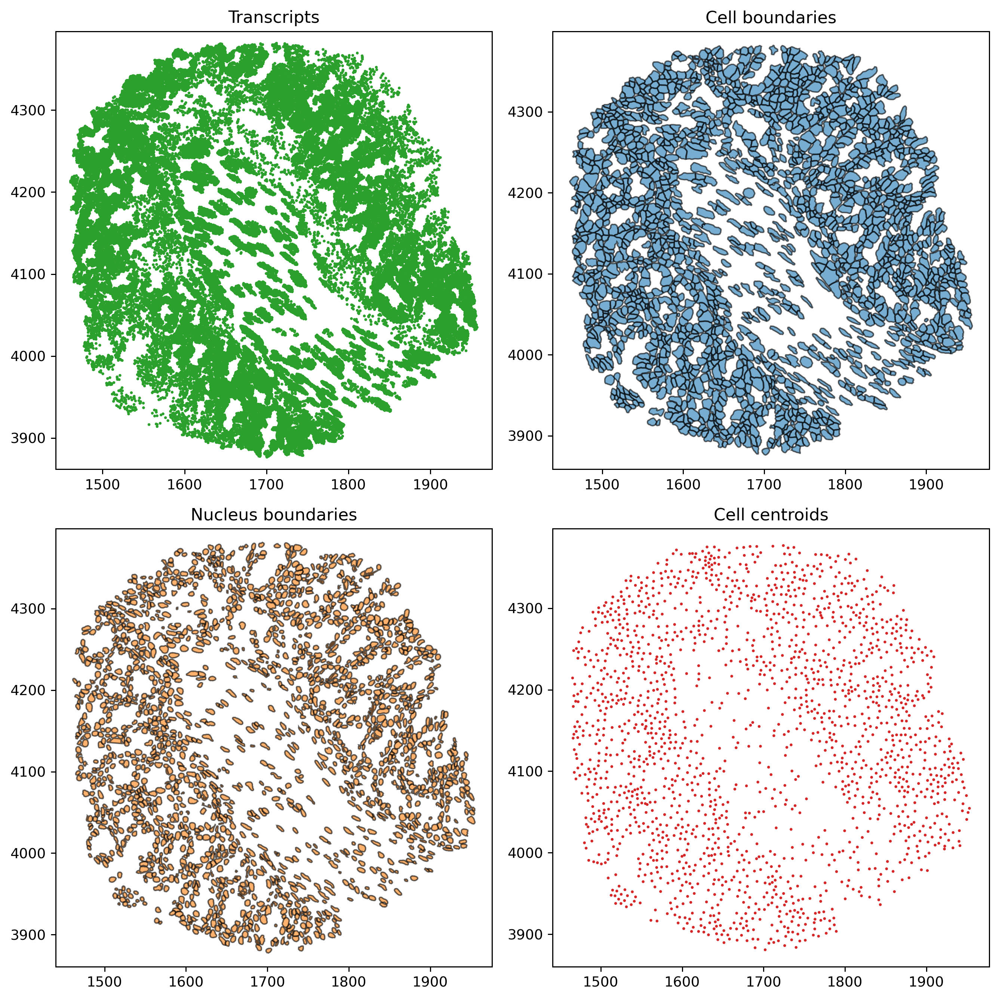

In [2]:
# Create a 2x2 subplot for visualizing different collections in the domain
fig, ax = plt.subplots(2, 2, figsize=(10, 10))

# Plot Transcripts
ax[0, 0].set_title('Transcripts')
ms.visualise.visualise(domain, ax=ax[0, 0], marker_size=1, objects_to_plot=('collection', 'Transcripts'), add_cbar=False)

# Plot Cell boundaries
ax[0, 1].set_title('Cell boundaries')
ms.visualise.visualise(domain, ax=ax[0, 1], marker_size=1, objects_to_plot=('collection', 'Cell boundaries'), add_cbar=False)

# Plot Nucleus boundaries
ax[1, 0].set_title('Nucleus boundaries')
ms.visualise.visualise(domain, ax=ax[1, 0], marker_size=1, objects_to_plot=('collection', 'Nucleus boundaries'), add_cbar=False)

# Plot Cell centroids
ax[1, 1].set_title('Cell centroids')
ms.visualise.visualise(domain, ax=ax[1, 1], marker_size=1, objects_to_plot=('collection', 'Cell centroids'), add_cbar=False)

### Delaunay networks from point-like data

If no boundary information about our spatial objects is given in our dataset (i.e., no segmentation mask), then Delaunay networks on point-like data are a common approximation of the local connectivity of the data. Its construction is based on an area (volume) filling process between all points such that edges are generated to produce triangles that do not contain any other point. Therefore, an edge between points presents the adjacency of the Voronoi cells of the data. For more information, see this [link](https://en.wikipedia.org/wiki/Delaunay_triangulation).

Applying this procedure to our cell centroids, are approximating cell-cell connectivity such that an edge represents approximate cell-cell boundary contact. Let's use the `ms.networks.generate_network` function to generate a Delaunay network on our 'Cell centroid' data by using the shorthand query syntax.

In [3]:
# Generate a Delaunay network on the 'Cell centroids' data
# The network will be stored in the domain.networks dictionary with the name 'Delaunay CC'
del_network = ms.networks.generate_network(
    domain,
    network_name='Delaunay CC',
    network_type='Delaunay',
    objects_as_nodes=('collection', 'Cell centroids')
)

Before we take a look at our network, we should mention what MuSpAn is doing when generating a network. The output of this function is a NetworkX object which means we can treat it as any other NetworkX network if we'd like. Also, we named our network 'Delaunay CC'. This name is the identifier given to the network, which is stored in the domain.network dictionary. This allows us to reuse the same network for analysis later on. Let's check this is the case.

In [4]:
print('Type of del_network =',type(del_network))
print('Stored networks in domain:',list(domain.networks.keys()))    

Type of del_network = <class 'networkx.classes.graph.Graph'>
Stored networks in domain: ['Delaunay CC']


Using the name of the network is the typical way we call our networks for analysis but if we can always retrieve our stored networks using the dictionary syntax as follows:

In [5]:
this_network=domain.networks['Delaunay CC']

Now, let's take a look at the network we generated using our helper visualise function `ms.visualise.visualise_network`. This provides the same functionality as `ms.visualise.visualise` but provides some additional arguments to modify the look of our networks on the domain. Check out our documentation for more detials on the arguments of `ms.visualise.visualise_network`.

(<Figure size 3240x1620 with 2 Axes>, <Axes: >)

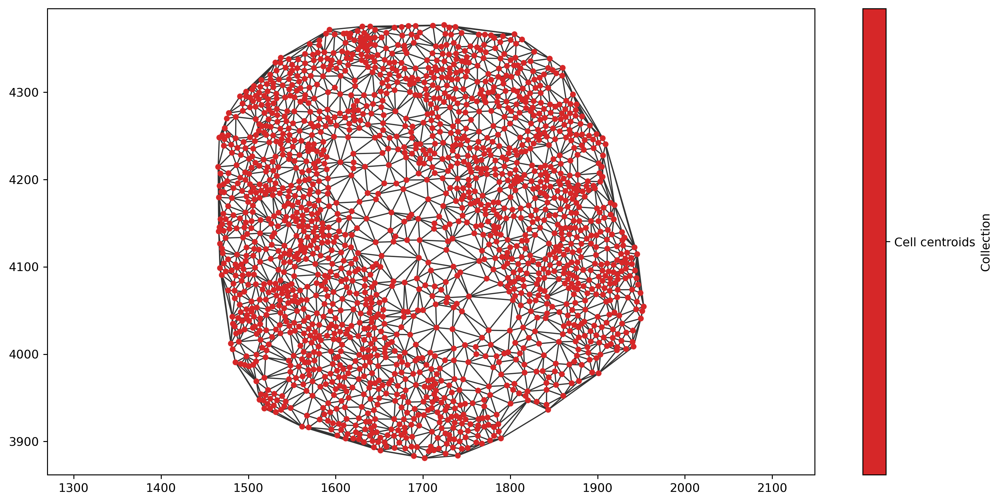

In [6]:
# Create a figure and axis for plotting the Delaunay network
fig, ax = plt.subplots(1, 1, figsize=(12, 6))

# Visualise the Delaunay network on the domain
# The visualise_kwargs argument allows us to specify additional visualization parameters
ms.visualise.visualise_network(
    domain,
    network_name='Delaunay CC',
    ax=ax,
    visualise_kwargs=dict(objects_to_plot=('collection', 'Cell centroids'), marker_size=15)
)

#### Controlling Edge Distance

Great, this looks like a Delaunay network of our Cell centroids point data. We can see that behind the scenes, MuSpAn has calculated the distance between the adjacent nodes and added this as an edge weight. In fact, a distance similarity 'Inverse distance' has also been calculated (but let's ignore this for now). Edge weights are values that can be used to describe the connectivity between nodes. We can check the different edge weights in the network but using the `edge viewer` functionality from networkX:

In [7]:
list(del_network.edges(data=True))[0]

(np.int64(74174),
 np.float64(74823.0),
 {'Distance': np.float64(6.999059285089887),
  'Inverse Distance': np.float64(1.0)})

Here, we pulled retrieved just the first edge that was stored in our edge list that is defined between objects with IDs 74174 and 74823. Knowing now that an edge exists between these two nodes, we can explicitly call these edge weight values using the dictionary structure of the network:

In [8]:
del_network[74174][74823]['Distance']

np.float64(6.999059285089887)

Depending on the context of our data and/or analysis, we may want to filter our edges depending on the distance of nodes. In our case, if we want an edge to represent two nodes in direct contact then we'd like the distance between them to be ~<25μm. We can do this by using the `max_edge_distance` and `min_edge_distance` parameters. Let's make the same network as above but now with filtered edge lengths: 

In [9]:
ms.networks.generate_network(domain,network_name='Delaunay CC filtered',network_type='Delaunay',
                             objects_as_nodes=('collection','Cell centroids'),min_edge_distance=0,max_edge_distance=25)

This should reduce the number of edges compared to our first network 'Delaunay CC'. Let's check this is the case and have a look the resultant networks.

In [10]:
print('Delaunay CC:',domain.networks['Delaunay CC'])
print('Delaunay CC filtered:',domain.networks['Delaunay CC filtered'])

Delaunay CC: Graph with 1852 nodes and 5523 edges
Delaunay CC filtered: Graph with 1852 nodes and 5298 edges


(<Figure size 3510x1620 with 2 Axes>,
 <Axes: title={'center': 'Delaunay CC filtered'}>)

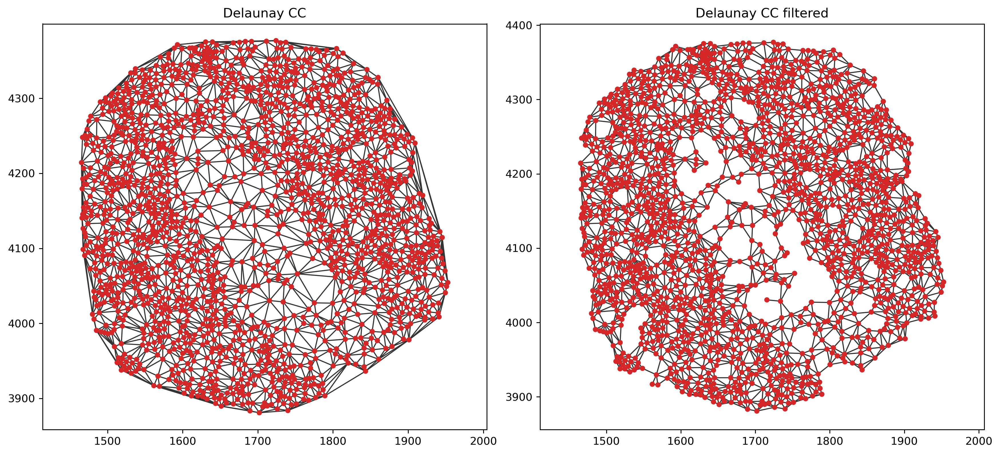

In [11]:
# Create a 1x2 subplot for visualizing the original and filtered Delaunay networks
fig, ax = plt.subplots(1, 2, figsize=(13, 6))

# Plot the original Delaunay network
ax[0].set_title('Delaunay CC')
ms.visualise.visualise_network(
    domain,
    network_name='Delaunay CC',
    ax=ax[0],
    edge_weight_name=None,
    visualise_kwargs=dict(objects_to_plot=('collection', 'Cell centroids'), marker_size=15, add_cbar=False)
)

# Plot the filtered Delaunay network
ax[1].set_title('Delaunay CC filtered')
ms.visualise.visualise_network(
    domain,
    network_name='Delaunay CC filtered',
    ax=ax[1],
    edge_weight_name=None,
    visualise_kwargs=dict(objects_to_plot=('collection', 'Cell centroids'), marker_size=15, add_cbar=False)
)

We can see that more of the tissue architural features are visable the following the distance filtration. We recommend using `max_edge_distance` and `min_edge_distance` parameters to prevent any unphysical edges in spatial networks.